## Projekt - Wizualizacja danych 2025
Analiza ofert pracy inżynierów oprogramowania w Polsce

Dataset: https://www.kaggle.com/code/krzysztofjamroz/software-engineers-jobs-in-poland-analysis?select=202406_soft_eng_jobs_pol.csv


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots


Przygotowanie zestawu danych (tylko dla lokalnego uruchamiania)

In [ ]:
import kagglehub
krzysztofjamroz_job_offers_for_software_engineers_in_poland_path = kagglehub.dataset_download('krzysztofjamroz/job-offers-for-software-engineers-in-poland')

In [ ]:
# Przygotowanie zestawu danych
history = {
  '2023-09-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202309_soft_eng_jobs_pol.csv'),
  '2023-10-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202310_soft_eng_jobs_pol.csv'),
  '2023-11-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202311_soft_eng_jobs_pol.csv'),
  '2023-12-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202312_soft_eng_jobs_pol.csv'),
  '2024-01-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202401_soft_eng_jobs_pol.csv'),
  '2024-02-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202402_soft_eng_jobs_pol.csv'),
  '2024-03-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202403_soft_eng_jobs_pol.csv'),
  '2024-04-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202404_soft_eng_jobs_pol.csv'),
  '2024-05-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202405_soft_eng_jobs_pol.csv'),
  '2024-06-01': pd.read_csv('/kaggle/input/job-offers-for-software-engineers-in-poland/202406_soft_eng_jobs_pol.csv'),
}

wspolrzedne_miast = {
    'Warszawa': (52.2297, 21.0122),
    'Kraków': (50.0647, 19.9450),
    'Wrocław': (51.1079, 17.0385),
    'Poznań': (52.4064, 16.9252),
    'Gdańsk': (54.3520, 18.6466),
    'Katowice': (50.2649, 19.0238),
    'Łódź': (51.7592, 19.4560),
    'Lublin': (51.2465, 22.5684),
    'Szczecin': (53.4285, 14.5528),
    'Bydgoszcz': (53.1235, 18.0084),
    'Białystok': (53.1325, 23.1688),
    'Rzeszów': (50.0412, 21.9991),
    'Toruń': (53.0138, 18.5984)
}

dfs = []
for report_date in history:
  df = history[report_date]
  df['report date'] = report_date
  df['report date'] = pd.to_datetime(df['report date'])
  dfs.append(df)

all = pd.concat(dfs)

columns = all.columns.to_list()
all['salary employment mean'] = round(all['salary employment min']*0.5 + all['salary employment max']*0.5)
all['salary b2b mean'] = round(all['salary b2b min']*0.5 + all['salary b2b max']*0.5)
all['contract type'] = all.apply(lambda x: 'both' if ((np.isnan(x['salary employment mean']) == False) & (np.isnan(x['salary b2b mean']) == False)) else False, axis=1)
all['contract type'] = all.apply(lambda x: 'b2b' if ((x['contract type'] == False) & (np.isnan(x['salary employment mean']) == True)) else x['contract type'], axis=1)
all['contract type'] = all.apply(lambda x: 'employment' if ((x['contract type'] == False) & (np.isnan(x['salary b2b mean']) == True)) else x['contract type'], axis=1)
all['contract type'] = all.apply(lambda x: 'none' if ((x['contract type'] == False)) else x['contract type'], axis=1)
all['company size'] = all['company size'].transform(lambda x: None if np.isnan(x) else min(10000, x))
all['company size'] = all['company size'].transform(lambda x: None if np.isnan(x) else str(round(x)) + "+")
all['is remote'] = all['location'].transform(lambda x: 'Non Remote' if x != 'Remote' else x)
latest = all[all['report date'] == all['report date'].unique().max()]
print("All offers count:", len(all))
print("Latest offers count:", len(latest))
display(latest.sample(5))

All offers count: 18209
Latest offers count: 1278


,id,company,company size,location,technology,seniority,salary employment min,salary employment max,salary b2b min,salary b2b max,report date,salary employment mean,salary b2b mean,contract type,is remote
886,3b8b8566a3fdfb3cf1989550277bcfeb,Primaris Services,None,Remote,Java,expert,NaN,NaN,26880.0,31080.0,2024-06-01,NaN,28980.0,b2b,Remote
627,4a3eceee9cca4705252ccf0c276a06a8,Altimetrik Poland,100+,Remote,Python,expert,NaN,NaN,22000.0,30000.0,2024-06-01,NaN,26000.0,b2b,Remote
736,e2e707265017d85e6d0b98a7765d30cb,Emerge Soft,100+,Remote,C/C++,mid,NaN,NaN,24000.0,27000.0,2024-06-01,NaN,25500.0,b2b,Remote
44,0696ceb79898287182f6ef2e0a95ebf1,Motorola Solutions Systems Polska Sp. z o.o.,1000+,Kraków,JavaScript,mid,12000.0,18000.0,NaN,NaN,2024-06-01,15000.0,NaN,employment,Non Remote
1236,f11c8caf11a671a62726020009e7231e,SHAPED THOUGHTS sp. z o.o.,None,Remote,Python,senior,25000.0,34500.0,28560.0,36960.0,2024-06-01,29750.0,32760.0,both,Remote


Rozkład ofert według miast

In [ ]:
all

,id,company,company size,location,technology,seniority,salary employment min,salary employment max,salary b2b min,salary b2b max,report date,salary employment mean,salary b2b mean,contract type,is remote
0,5bfb1ec0512511bd22e1bf2f254ca81f,Link Group,100+,Kraków,Python,mid,22000.0,29000.0,NaN,NaN,2023-09-01,25500.0,NaN,employment,Non Remote
1,8fa6237a5a060886969c92c40a03e1d0,Link Group,100+,Katowice,Python,mid,22000.0,29000.0,NaN,NaN,2023-09-01,25500.0,NaN,employment,Non Remote
2,2007c9732dfdca3886159998df9fe690,Link Group,100+,Warszawa,C#,senior,NaN,NaN,30000.0,40000.0,2023-09-01,NaN,35000.0,b2b,Non Remote
3,d8fccc479de7039201050b21f077db8a,Link Group,100+,Katowice,C#,senior,NaN,NaN,30000.0,40000.0,2023-09-01,NaN,35000.0,b2b,Non Remote
4,677f9dcf2a3b0e484410df669b31db96,Link Group,100+,Kraków,C#,senior,NaN,NaN,30000.0,40000.0,2023-09-01,NaN,35000.0,b2b,Non Remote
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273,e44141c36ae3ba3cc93ff9430d84f47b,Centralny Ośrodek Informatyki,1000+,Remote,JavaScript,mid,11000.0,13000.0,NaN,NaN,2024-06-01,12000.0,NaN,employment,Remote
1274,d02c444dd8903d6acf2345a2d2432fea,Pikseo Spółka z ograniczoną odpowiedzialnością...,None,Remote,Python,mid,7000.0,14000.0,7000.0,12000.0,2024-06-01,10500.0,9500.0,both,Remote
1275,ed3326ecf62b80acdcfb257307afc236,"\MANUBIA\"" sp. z o.o.""",None,Remote,C#,mid,NaN,NaN,9600.0,13600.0,2024-06-01,NaN,11600.0,b2b,Remote
1276,e321417af992f68293e5877b6120fea8,ING Bank Śląski,10000+,Katowice,C#,senior,8400.0,22000.0,NaN,NaN,2024-06-01,15200.0,NaN,employment,Non Remote


In [ ]:
latest

,id,company,company size,location,technology,seniority,salary employment min,salary employment max,salary b2b min,salary b2b max,report date,salary employment mean,salary b2b mean,contract type,is remote
0,35038634e2f92edc40b962cd238068d8,Link Group,100+,Gdańsk,C/C++,senior,25000.0,30000.0,NaN,NaN,2024-06-01,27500.0,NaN,employment,Non Remote
1,61cefb9667ca88b123e5a178663feafa,Link Group,100+,Kraków,C/C++,senior,25000.0,30000.0,NaN,NaN,2024-06-01,27500.0,NaN,employment,Non Remote
2,d692acf78be9751261354bbd222cf915,Link Group,100+,Warszawa,C#,mid,19000.0,22000.0,NaN,NaN,2024-06-01,20500.0,NaN,employment,Non Remote
3,ad6bd02c4ef7d55b71f1cb90949d9544,Link Group,100+,Warszawa,Mobile,mid,18000.0,20000.0,NaN,NaN,2024-06-01,19000.0,NaN,employment,Non Remote
4,0444ac7178768725d37f30c5ff459268,Link Group,100+,Warszawa,Python,senior,NaN,NaN,38640.0,43680.0,2024-06-01,NaN,41160.0,b2b,Non Remote
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1273,e44141c36ae3ba3cc93ff9430d84f47b,Centralny Ośrodek Informatyki,1000+,Remote,JavaScript,mid,11000.0,13000.0,NaN,NaN,2024-06-01,12000.0,NaN,employment,Remote
1274,d02c444dd8903d6acf2345a2d2432fea,Pikseo Spółka z ograniczoną odpowiedzialnością...,None,Remote,Python,mid,7000.0,14000.0,7000.0,12000.0,2024-06-01,10500.0,9500.0,both,Remote
1275,ed3326ecf62b80acdcfb257307afc236,"\MANUBIA\"" sp. z o.o.""",None,Remote,C#,mid,NaN,NaN,9600.0,13600.0,2024-06-01,NaN,11600.0,b2b,Remote
1276,e321417af992f68293e5877b6120fea8,ING Bank Śląski,10000+,Katowice,C#,senior,8400.0,22000.0,NaN,NaN,2024-06-01,15200.0,NaN,employment,Non Remote


## Oferty per miasto - wszystkie od września 2023


In [ ]:
filtered_df = all[all["location"] != "Remote"]

location_counts = filtered_df["location"].value_counts().reset_index()
location_counts.columns = ["location", "count"]

fig = px.bar(location_counts, x="location", y="count", title="Liczba ofert per miasto od września 2023 do czerwca 2024 - praca stacjonarna",
             labels={"location": "Miasto", "count": "Liczba ofert"},
             text="count",
             width=800,
             color="location",
             color_discrete_sequence=px.colors.qualitative.Dark2,
             )

fig.update_traces(textposition="outside")
fig.update_xaxes(categoryorder="total descending")
fig.update_layout(showlegend=False)

fig.show()

In [ ]:
miasta_all = all[all['location'] != 'Remote']['location'].value_counts().reset_index()
miasta_all.columns = ['miasto', 'liczba_ofert']

miasta_all['lat'] = miasta_all['miasto'].map(lambda x: wspolrzedne_miast[x][0] if x in wspolrzedne_miast else None)
miasta_all['lon'] = miasta_all['miasto'].map(lambda x: wspolrzedne_miast[x][1] if x in wspolrzedne_miast else None)
miasta = miasta_all.dropna(subset=['lat', 'lon'])

fig = px.scatter_mapbox(
    miasta,
    lat='lat',
    lon='lon',
    size='liczba_ofert',
    hover_name='miasto',
    hover_data={'liczba_ofert': True, 'lat': False, 'lon': False},
    color='liczba_ofert',
    color_continuous_scale=px.colors.sequential.matter,
    size_max=40,
    zoom=5,
    center={"lat": 52.1, "lon": 19.4},
    title='Liczba ofert pracy dla programistów w polskich miastach od września 2023 do czerwca 2024',
    width=1200
)
fig.update_layout(
    mapbox_style="carto-positron",
    margin={"r":0,"t":50,"l":0,"b":0},
    coloraxis_colorbar=dict(title="Liczba ofert")
    )
fig.show()


In [ ]:
tech_by_location = all.groupby(['location', 'technology']).size().reset_index(name="count")
fig = px.treemap(tech_by_location,
                 path=['location', 'technology'],
                 values='count',
                 color='count',
                 color_continuous_scale=px.colors.sequential.matter,
                 title='Najpopularniejsze technologie programistyczne dla miast i pracy zdalnej od września 2023 do czerwca 2024',
                 width=1200)
fig.update_layout(margin=dict(t=50, l=25, r=25, b=25), coloraxis_colorbar=dict(title="Liczba ofert"))
fig.show()


In [ ]:
contract_dist = all[all['location'] != 'Remote'].groupby(['location', 'contract type']).size().unstack().fillna(0)
contract_dist = contract_dist.div(contract_dist.sum(axis=1), axis=0) * 100
contract_dist = contract_dist.reset_index().rename(columns={'location': 'Miasto'})

contract_type_mapping = {
    'b2b': 'Tylko B2B',
    'both': 'B2B i UoP',
    'employment': 'Tylko UoP'
}
contract_dist = contract_dist.rename(columns=contract_type_mapping)

contract_dist_melted = contract_dist.melt(id_vars='Miasto', var_name='Typ kontraktu', value_name='Procent ofert')

fig = px.bar(
    contract_dist_melted,
    y='Miasto',
    x='Procent ofert',
    color='Typ kontraktu',
    orientation='h',
    title='Proporcje typów kontraktów na tle miast od września 2023 do czerwca 2024',
    color_discrete_sequence=['#1E8449', '#77B43F', '#5D6D7E'],
    width=800,
    height=400
)

fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend=dict(title='Typ kontraktu', y=1, yanchor='top', x=1, xanchor='left'),
    margin=dict(l=50, r=0, t=50, b=50)
)

fig.show()

In [ ]:
remote_jobs = all[all['location'] == 'Remote']
contract_counts = remote_jobs['contract type'].value_counts()
label_map = {
    'b2b': 'Tylko B2B',
    'both': 'B2B i UoP',
    'employment': 'Tylko UoP'
}

contract_df = contract_counts.reset_index()
contract_df.columns = ['contract type', 'count']
contract_df['contract type'] = contract_df['contract type'].map(label_map)

fig = px.pie(
    contract_df,
    names='contract type',
    values='count',
    title='Rozkład typów kontraktów dla pracy zdalnej od września 2023 do czerwca 2024',
    color='contract type',
    color_discrete_sequence=px.colors.qualitative.Dark2,
    width=750
)

fig.show()

## Oferty per miasto - dane z czerwca 2024

In [ ]:
filtered_df = latest[latest["location"] != "Remote"]

location_counts = filtered_df["location"].value_counts().reset_index()
location_counts.columns = ["location", "count"]

fig = px.bar(location_counts, x="location", y="count", title="Liczba ofert per miasto w dniu 1 czerwca 2024 - praca stacjonarna",
             labels={"location": "Miasto", "count": "Liczba ofert"},
             text="count",
             width=800,
             color="location",
             color_discrete_sequence=px.colors.qualitative.Dark2,
             )

fig.update_traces(textposition="outside")
fig.update_xaxes(categoryorder="total descending")
fig.update_layout(showlegend=False)

fig.show()

In [ ]:
miasta_latest = latest[latest['location'] != 'Remote']['location'].value_counts().reset_index()
miasta_latest.columns = ['miasto', 'liczba_ofert']

miasta_latest['lat'] = miasta_latest['miasto'].map(lambda x: wspolrzedne_miast[x][0] if x in wspolrzedne_miast else None)
miasta_latest['lon'] = miasta_latest['miasto'].map(lambda x: wspolrzedne_miast[x][1] if x in wspolrzedne_miast else None)
miasta = miasta_latest.dropna(subset=['lat', 'lon'])

# Tworzenie mapy
fig = px.scatter_mapbox(
    miasta,
    lat='lat',
    lon='lon',
    size='liczba_ofert',
    hover_name='miasto',
    hover_data={'liczba_ofert': True, 'lat': False, 'lon': False},
    color='liczba_ofert',
    color_continuous_scale=px.colors.sequential.Plasma,
    size_max=40,
    zoom=5,
    center={"lat": 52.1, "lon": 19.4},
    title='Liczba ofert pracy dla programistów w polskich miastach w dniu 1 czerwca 2024',
    width=1200
)
fig.update_layout(
    mapbox_style="carto-positron",
    margin={"r":0,"t":50,"l":0,"b":0},
    coloraxis_colorbar=dict(title="Liczba ofert")
    )
fig.show()


In [ ]:
tech_by_location = latest.groupby(['location', 'technology']).size().reset_index(name="count")
fig = px.treemap(tech_by_location,
                 path=['location', 'technology'],
                 values='count',
                 color='count',
                 color_continuous_scale=px.colors.sequential.matter,
                 title='Najpopularniejsze technologie programistyczne dla miast i pracy zdalnej w dniu 1 czerwca 2024',
                 width=1200)
fig.update_layout(margin=dict(t=50, l=25, r=25, b=25), coloraxis_colorbar=dict(title="Liczba ofert"))
fig.show()


In [ ]:
contract_dist = latest[latest['location'] != 'Remote'].groupby(['location', 'contract type']).size().unstack().fillna(0)
contract_dist = contract_dist.div(contract_dist.sum(axis=1), axis=0) * 100
contract_dist = contract_dist.reset_index().rename(columns={'location': 'Miasto'})

contract_type_mapping = {
    'b2b': 'Tylko B2B',
    'both': 'B2B i UoP',
    'employment': 'Tylko UoP'
}
contract_dist = contract_dist.rename(columns=contract_type_mapping)

contract_dist_melted = contract_dist.melt(id_vars='Miasto', var_name='Typ kontraktu', value_name='Procent ofert')

fig = px.bar(
    contract_dist_melted,
    y='Miasto',
    x='Procent ofert',
    color='Typ kontraktu',
    orientation='h',
    title='Proporcje typów kontraktów na tle miast - oferty z 1 czerwca 2024',
    color_discrete_sequence=['#1E8449', '#77B43F', '#5D6D7E'],
    width=800,
    height=400
)

fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend=dict(title='Typ kontraktu', y=1, yanchor='top', x=1, xanchor='left'),
    margin=dict(l=50, r=0, t=50, b=50)
)

fig.show()

In [ ]:
remote_jobs = latest[latest['location'] == 'Remote']
contract_counts = remote_jobs['contract type'].value_counts()
label_map = {
    'b2b': 'Tylko B2B',
    'both': 'B2B i UoP',
    'employment': 'Tylko UoP'
}

contract_df = contract_counts.reset_index()
contract_df.columns = ['contract type', 'count']
contract_df['contract type'] = contract_df['contract type'].map(label_map)

fig = px.pie(
    contract_df,
    names='contract type',
    values='count',
    title='Rozkład typów kontraktów dla pracy zdalnej - oferty z 1 czerwca 2024',
    color='contract type',
    color_discrete_sequence=px.colors.qualitative.Dark2,
    width=700
)

fig.show()

## Analiza wszystkich ofert

In [ ]:
salaries = all.copy()
salaries = salaries.rename(columns={'salary employment min': 'salary min', 'salary employment mean': 'salary mean', 'salary employment max': 'salary max'})
latest_salaries = salaries[salaries['report date'] == salaries['report date'].unique().max()]

salaries.sample(5)


,id,company,company size,location,technology,seniority,salary min,salary max,salary b2b min,salary b2b max,report date,salary mean,salary b2b mean,contract type,is remote
833,0314e73ac5735b64618229db1a68efe7,Alter Solutions Polska,100+,Warszawa,Java,mid,NaN,NaN,20000.0,24300.0,2023-12-01,NaN,22150.0,b2b,Non Remote
1083,799b50348ba996cca23afa88a1d702be,Zowie,None,Remote,Scala,mid,NaN,NaN,13000.0,20000.0,2024-05-01,NaN,16500.0,b2b,Remote
934,7935cb25aacfcd74991d574c3561d171,Isolution,100+,Warszawa,Java,mid,NaN,NaN,21000.0,24000.0,2023-11-01,NaN,22500.0,b2b,Non Remote
497,d1fe85dd2d4de0c2344cb60a612d8cc9,Keep IT Simple,10+,Wrocław,C#,junior,NaN,NaN,8000.0,12000.0,2023-09-01,NaN,10000.0,b2b,Non Remote
381,5f40e37af067229fd2add90ce4c1c477,ClearScale,100+,Remote,C#,expert,NaN,NaN,35249.0,42299.0,2023-11-01,NaN,38774.0,b2b,Remote


In [ ]:
def get_offers(min_val, max_val):
  mean = (max_val + min_val)/2
  range = max(mean*0.1, (max_val - min_val)/2)
  salary = np.random.normal(mean, range/3, size=1000).round()
  return '|'.join(salary.astype('str').tolist())

offers = salaries.copy()
offers['offer'] = offers.apply(lambda x: get_offers(x['salary min'], x['salary max']), axis=1)
offers = offers.drop(columns=['salary min', 'salary max', 'salary mean'])
offers = offers.set_index(offers.columns[:-1].to_list())
offers = offers.apply(lambda x: x.str.split('|').explode()).reset_index()
offers['offer'] = offers['offer'].astype('float')
latest_offers = offers[offers['report date'] == offers['report date'].unique().max()]

seniority_levels = ['junior', 'mid', 'senior', 'expert']
colors = ['indianred', 'lightseagreen', 'coral', 'darkcyan']

fig = go.Figure()

for i, seniority in enumerate(seniority_levels):
    subset = latest_offers[latest_offers['seniority'] == seniority]
    subset = subset[subset['offer'].notna()]
    median_salary = round(subset['offer'].median() / 100) * 100

    fig.add_trace(go.Histogram(
        x=subset['offer'],
        name=seniority,
        marker_color=colors[i],
        opacity=0.75,
    ))

    # linia mediany
    fig.add_shape(
        type="line",
        x0=median_salary,
        y0=0,
        x1=median_salary,
        y1=3500,
        line=dict(color="black", width=2, dash="dash"),
        xref='x',
        yref='y'
    )
    fig.add_annotation(
        x=median_salary,
        y=3500,
        text=f"{median_salary} zł",
        showarrow=False,
        yanchor='bottom',
        font=dict(color='black', size=12)
    )

fig.update_layout(
    title='Porównanie zarobków na tle doświadczenia',
    xaxis_title='Wynagrodzenie w tysiącach (PLN)',
    yaxis_title='Ilość ofert',
    barmode='overlay',
    bargap=0.1,
    legend_title="Doświadczenie",
    width=1200,
)

fig.show()


In [ ]:
def wykres_zarobkow_dla_segmentu(nazwa_segmentu, tekst_segmentu, kolejność=None):
    latest_offers_clean = latest_offers.copy()
    latest_offers_clean['offer'] = pd.to_numeric(latest_offers_clean['offer'], errors='coerce')
    latest_offers_clean = latest_offers_clean[np.isfinite(latest_offers_clean['offer'])]

    experience = ['Junior', 'Mid', 'Senior', 'Expert']

    if kolejność:
        segmenty = kolejność
    else:
        segmenty = latest_salaries.groupby([nazwa_segmentu])['salary mean'].count().reset_index()
        segmenty = segmenty[segmenty['salary mean'] > 100][nazwa_segmentu].to_list()

    # Kolory i układ
    kolory = ['indianred', 'lightseagreen', 'coral', 'darkcyan']

    # Generowanie tytułów
    subplot_titles = []
    for _ in segmenty:
        for poziom in experience:
            subplot_titles.append(f"{poziom}")

    fig = make_subplots(
        rows=len(segmenty),
        cols=4,
        subplot_titles=subplot_titles,
        vertical_spacing=0.1,
        horizontal_spacing=0.05
    )

    for j, segment in enumerate(segmenty):
        for i, poziom in enumerate(experience):
            idx = j * 4 + i

            # Filtracja i czyszczenie danych
            dane = latest_offers_clean.loc[
                (latest_offers_clean['seniority'] == poziom.lower()) &
                (latest_offers_clean[nazwa_segmentu] == segment)
            ]

            if not dane.empty:
                mediana = round(dane['offer'].median())
                counts, bins = np.histogram(dane['offer'], bins=50)
                max_count = counts.max() if counts.size > 0 else 0
            else:
                mediana = 0
                max_count = 0

            if not dane.empty and mediana > 0:
                # Histogram
                fig.add_trace(
                    go.Histogram(
                        x=dane['offer'],
                        marker_color=kolory[i],
                        showlegend=False,
                        opacity=0.7,
                        nbinsx=50
                    ),
                    row=j+1,
                    col=i+1
                )

                # Linia mediany
                fig.add_shape(
                    type="line",
                    x0=mediana,
                    x1=mediana,
                    y0=0,
                    y1=max_count * 1.1,
                    line=dict(color="black", width=3),
                    xref=f"x{idx+1}",
                    yref=f"y{idx+1}"
                )

                # Adnotacje
                fig.add_annotation(
                    x=mediana + 5000,
                    y=max_count * 0.8,
                    text=f"{segment}<br>Mediana: {mediana} zł",
                    showarrow=False,
                    bgcolor="white",
                    bordercolor="black",
                    borderwidth=1,
                    xref=f"x{idx+1}",
                    yref=f"y{idx+1}"
                )

                # Tytuł z medianą
                fig.layout.annotations[idx].update(text=f"{poziom}<br>Mediana: {mediana} zł")
            else:
                # Ukryj pusty wykres
                fig.update_xaxes(visible=False, row=j+1, col=i+1)
                fig.update_yaxes(visible=False, row=j+1, col=i+1)
                fig.add_annotation(
                    text="<b>Brak danych</b>",
                    xref=f"x{idx+1}",
                    yref=f"y{idx+1}",
                    x=0.5,
                    y=0.5,
                    showarrow=False,
                    font=dict(size=14, color="red")
                )

    fig.update_layout(
        title_text=f"<b>Rozkład zarobków według {tekst_segmentu}</b>",
        height=250*len(segmenty),
        width=1400,
        margin=dict(t=120),
        title_x=0.5,
        title_font=dict(size=20)
    )

    for i in range(1,5):
        fig.update_xaxes(
            title_text="Wynagrodzenie (PLN)",
            row=len(segmenty),
            col=i,
            title_font=dict(size=12)
        )

    fig.show()

wykres_zarobkow_dla_segmentu('technology', "technologii", ['Java', 'Python', 'C#', 'C/C++', 'JavaScript', 'PHP', "Kotlin"])

In [ ]:
wykres_zarobkow_dla_segmentu('location', "miasta", ['Warszawa', 'Katowice', 'Wrocław', 'Gdańsk'])

In [ ]:
b2b_salaries = all[all['contract type'] == 'b2b']['salary b2b mean'].dropna()
uop_salaries = all[all['contract type'] == 'employment']['salary employment mean'].dropna()

colors = px.colors.qualitative.Dark2[:3]

fig = go.Figure()

fig.add_trace(go.Histogram(x=b2b_salaries, name='B2B', opacity=0.7, marker_color=colors[0]))
fig.add_trace(go.Histogram(x=uop_salaries, name='UoP', opacity=0.7, marker_color=colors[2]))

fig.update_layout(
    title='Rozkład wynagrodzeń dla B2B vs UoP',
    xaxis_title='Wynagrodzenie',
    yaxis_title='Liczba ofert',
    barmode='overlay',
    width=1200
)

fig.show()


5. Trendy czasowe ofert

<ipython-input-148-1fda12a73e94>:3: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



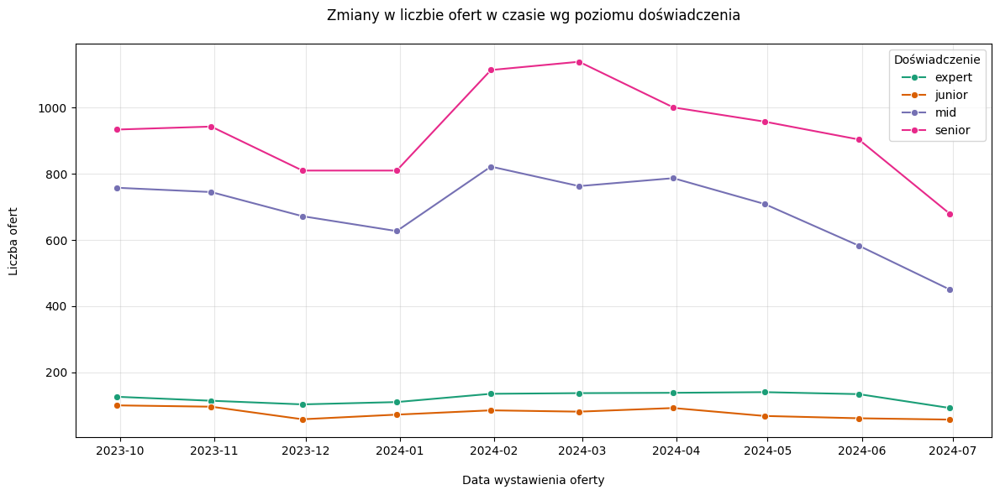

In [ ]:
plt.figure(figsize=(12,6))
sns.lineplot(data=all.groupby([pd.Grouper(key='report date', freq='M'),
                              'seniority']).size().reset_index(name='count'),
            x='report date', y='count', hue='seniority',
            palette='Dark2', marker='o')
plt.title('Zmiany w liczbie ofert w czasie wg poziomu doświadczenia', pad=20)
plt.xlabel('Data wystawienia oferty', labelpad=15)
plt.ylabel('Liczba ofert', labelpad=15)
plt.legend(title='Doświadczenie', bbox_to_anchor=(1,1))
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


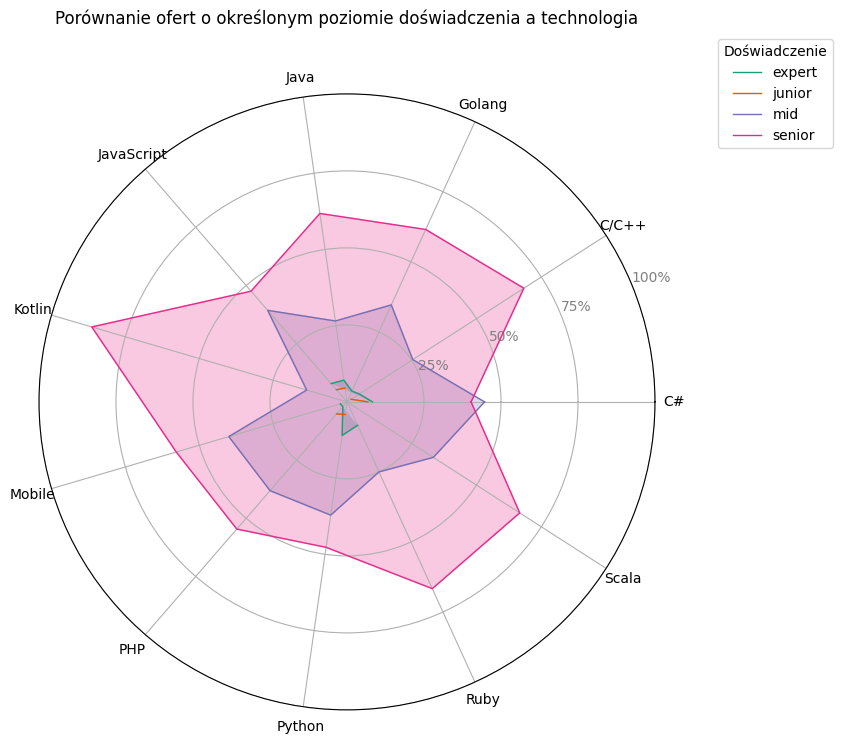

In [ ]:
from math import pi

tech_senior = latest.explode('technology').groupby(['technology', 'seniority']).size().unstack()
tech_senior = tech_senior.div(tech_senior.sum(axis=1), axis=0)

categories = tech_senior.index.tolist()
N = len(categories)

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

kolory = plt.cm.Dark2.colors

plt.figure(figsize=(8,8))
ax = plt.subplot(111, polar=True)

for i, seniority in enumerate(tech_senior.columns):
    values = tech_senior[seniority].tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1, label=seniority, color=kolory[i])
    ax.fill(angles, values, alpha=0.25, color=kolory[i])

plt.xticks(angles[:-1], categories)
plt.yticks([0.25, 0.5, 0.75, 1], ["25%","50%","75%","100%"], color="grey", size=10)
plt.title('Porównanie ofert o określonym poziomie doświadczenia a technologia', y=1.1)
plt.legend(title="Doświadczenie", loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()

In [ ]:
b2b_data = all[all['contract type'] == 'b2b'].dropna(subset=['salary b2b mean'])

fig = px.box(b2b_data,
             x='company size',
             y='salary b2b mean',
             title='Rozkład wynagrodzeń B2B według wielkości firmy',
             labels={'salary b2b mean': 'Wynagrodzenie B2B', 'company size': 'Wielkość firmy'},
             color='company size',
             color_discrete_sequence=px.colors.qualitative.Dark2)

fig.update_layout(width=1000, height=600, showlegend=False)
fig.update_xaxes(categoryorder="category ascending")
fig.show()


In [ ]:
uop_data = all[all['contract type'] == 'employment'].dropna(subset=['salary employment mean'])

fig = px.box(uop_data,
             x='company size',
             y='salary employment mean',
             title='Rozkład wynagrodzeń UoP według wielkości firmy',
             labels={'salary employment mean': 'Wynagrodzenie UoP', 'company size': 'Wielkość firmy'},
             color='company size',
             color_discrete_sequence=px.colors.qualitative.Dark2)

fig.update_layout(width=1000, height=600, showlegend=False)
fig.update_xaxes(categoryorder="category ascending")
fig.show()
